In [ ]:
!pip install pycocotools opencv-python scikit-learn

import os
import random
import numpy as np
import cv2
import matplotlib.pyplot as plt
from pycocotools.coco import COCO
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras import layers, models

print("TensorFlow version:", tf.__version__)

In [ ]:
def preprocess_image_and_mask(img_id, target_size=(128, 128)):
    img_info = coco.loadImgs(img_id)[0]
    img_path = os.path.join(img_dir, img_info['file_name'])

    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    ann_ids = coco.getAnnIds(imgIds=img_id)
    anns = coco.loadAnns(ann_ids)

    if len(anns) == 0:
        mask = np.zeros((img_info['height'], img_info['width']), dtype=np.uint8)
    else:
        # Take largest object
        largest_ann = max(anns, key=lambda x: x['area'])
        mask = coco.annToMask(largest_ann)

    # Resize
    image_resized = cv2.resize(image, target_size, interpolation=cv2.INTER_LINEAR)
    mask_resized = cv2.resize(mask, target_size, interpolation=cv2.INTER_NEAREST)

    # Normalize image
    image_resized = image_resized.astype(np.float32) / 255.0
    mask_resized = mask_resized.astype(np.float32)

    return image_resized, mask_resized

In [ ]:
# ==========================
# Step 5: Compile model with BCE + Dice Loss
# ==========================
def dice_loss(y_true, y_pred, smooth=1e-6):
    y_true_f = tf.reshape(y_true, [-1])
    y_pred_f = tf.reshape(y_pred, [-1])
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    return 1 - (2. * intersection + smooth) / (tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) + smooth)

def bce_dice_loss(y_true, y_pred):
    bce = tf.keras.losses.BinaryCrossentropy()(y_true, y_pred)
    return bce + dice_loss(y_true, y_pred)

model = build_unet((128, 128, 3))
model.compile(optimizer='adam', loss=bce_dice_loss, metrics=['accuracy'])
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 128, 128,  │        448 │ input_layer[0][0] │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 128, 128,  │      2,320 │ conv2d[0][0]      │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 64, 64,    │          0 │ conv2d_1[0][0]    │
│ (MaxPooling2D)      │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 64, 64,    │      4,640 │ max_pooling2d[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 64, 64,    │      9,248 │ conv2d_2[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 32, 32,    │          0 │ conv2d_3[0][0]    │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 32, 32,    │     18,496 │ max_pooling2d_1[… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 32, 32,    │     36,928 │ conv2d_4[0][0]    │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 16, 16,    │          0 │ conv2d_5[0][0]    │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 16, 16,    │     73,856 │ max_pooling2d_2[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_7 (Conv2D)   │ (None, 16, 16,    │    147,584 │ conv2d_6[0][0]    │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d       │ (None, 32, 32,    │          0 │ conv2d_7[0][0]    │
│ (UpSampling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 32, 32,    │          0 │ up_sampling2d[0]… │
│ (Concatenate)       │ 192)              │            │ conv2d_5[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_8 (Conv2D)   │ (None, 32, 32,    │    110,656 │ concatenate[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_9 (Conv2D)   │ (None, 32, 32,    │     36,928 │ conv2d_8[0][0]    │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d_1     │ (None, 64, 64,    │          0 │ conv2d_9[0][0]  

 Total params: 487,297 (1.86 MB)

 Trainable params: 487,297 (1.86 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Step 6: Train with checkpoints
# ==========================
callbacks = [
    tf.keras.callbacks.ModelCheckpoint("best_model.h5", save_best_only=True, monitor="val_loss"),
    tf.keras.callbacks.EarlyStopping(patience=5, restore_best_weights=True)
]

history = model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=2,   # train longer
    batch_size=8,
    callbacks=callbacks
)

Epoch 1/2
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.6489 - loss: 1.3882

30/30 ━━━━━━━━━━━━━━━━━━━━ 63s 2s/step - accuracy: 0.6525 - loss: 1.3868 - val_accuracy: 0.8059 - val_loss: 1.2878
Epoch 2/2
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.8111 - loss: 1.2758

30/30 ━━━━━━━━━━━━━━━━━━━━ 82s 2s/step - accuracy: 0.8110 - loss: 1.2761 - val_accuracy: 0.8059 - val_loss: 1.2767


In [ ]:
loss, accuracy = model.evaluate(X_val, y_val)
print(f"Validation Accuracy: {accuracy:.2f}")

2/2 ━━━━━━━━━━━━━━━━━━━━ 6s 2s/step - accuracy: 0.8014 - loss: 1.2829
Validation Accuracy: 0.81


loading annotations into memory...
Done (t=2.51s)
creating index...
index created!


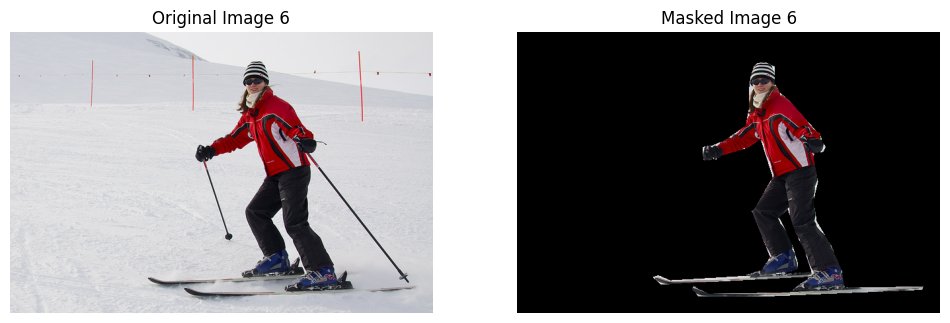

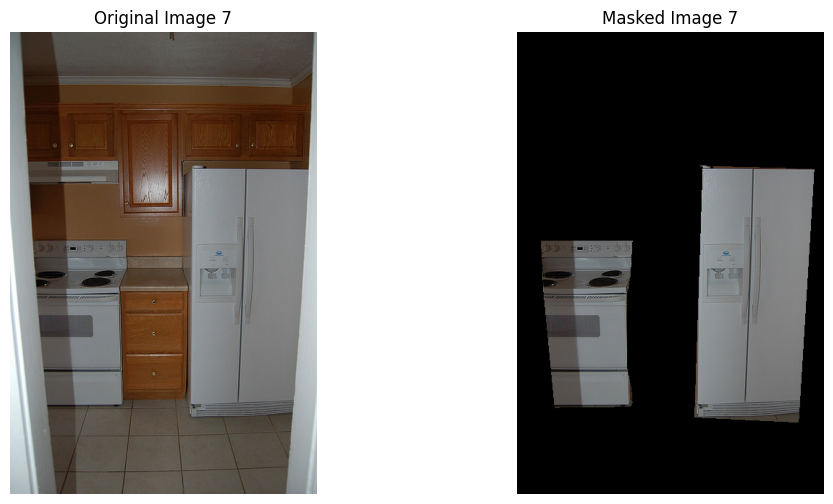

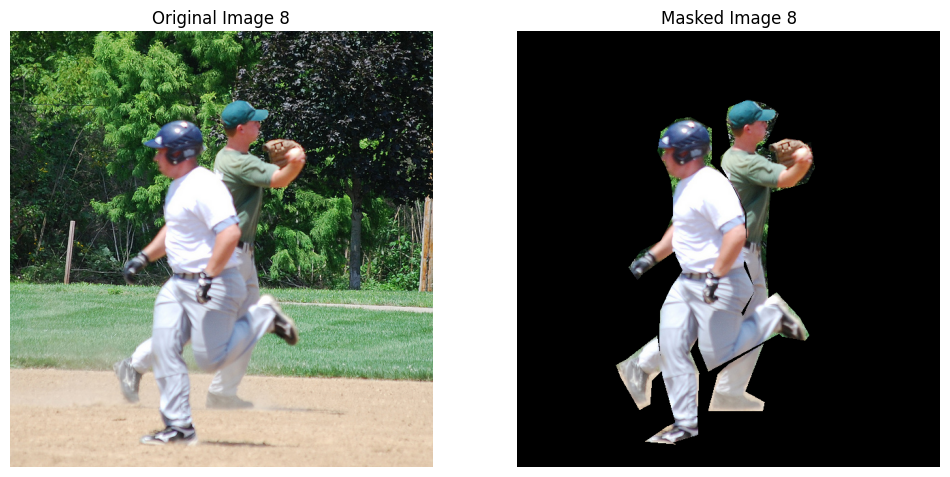

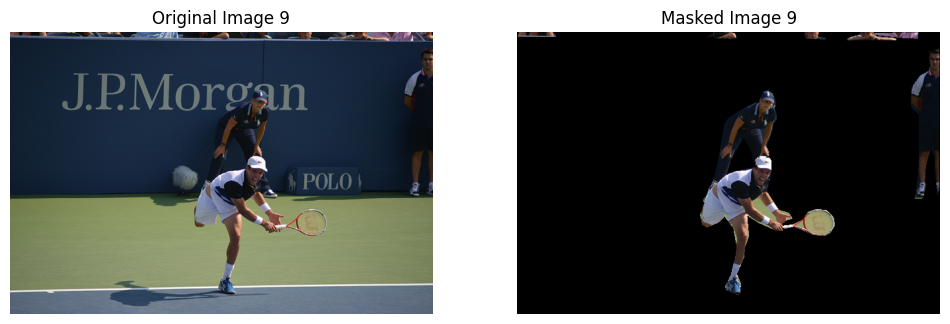

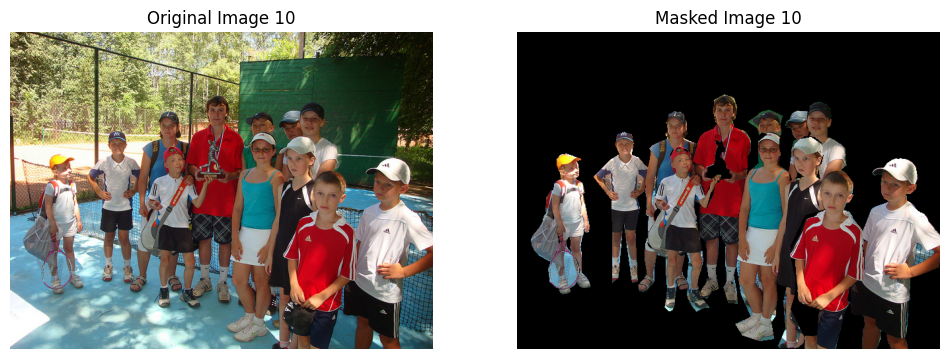

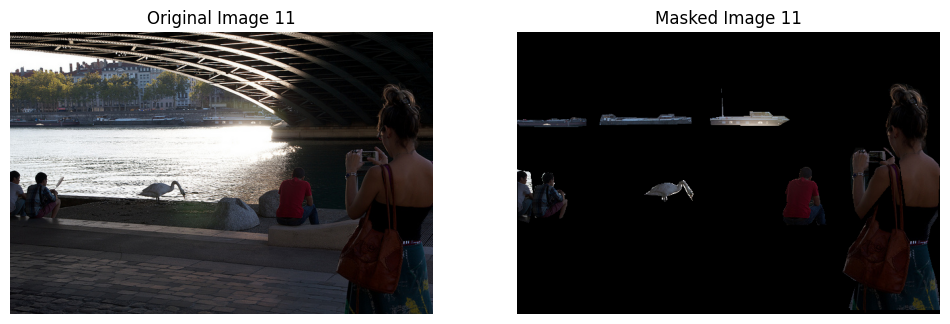

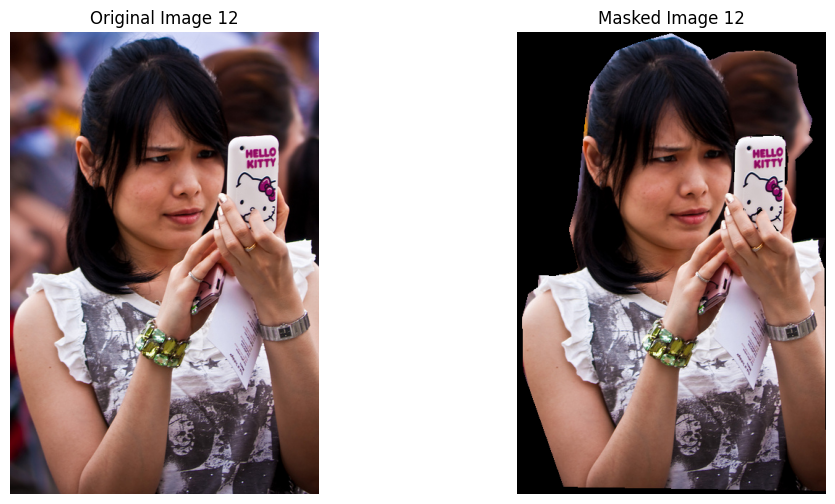

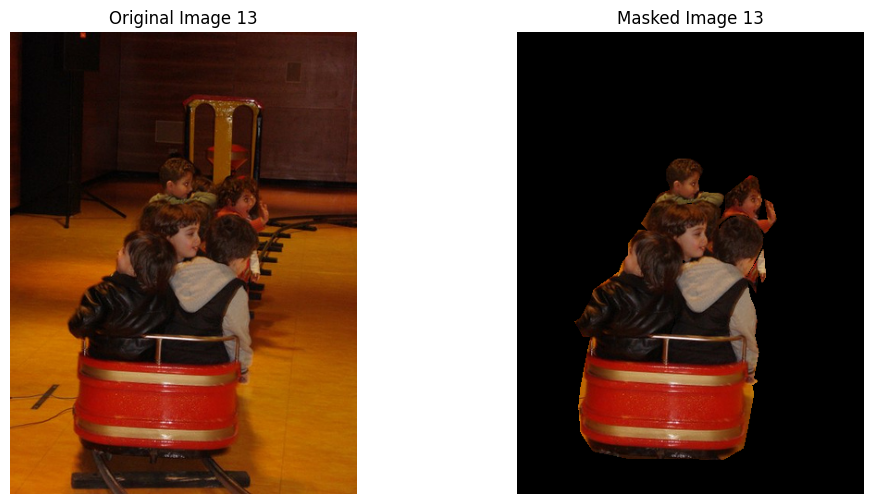

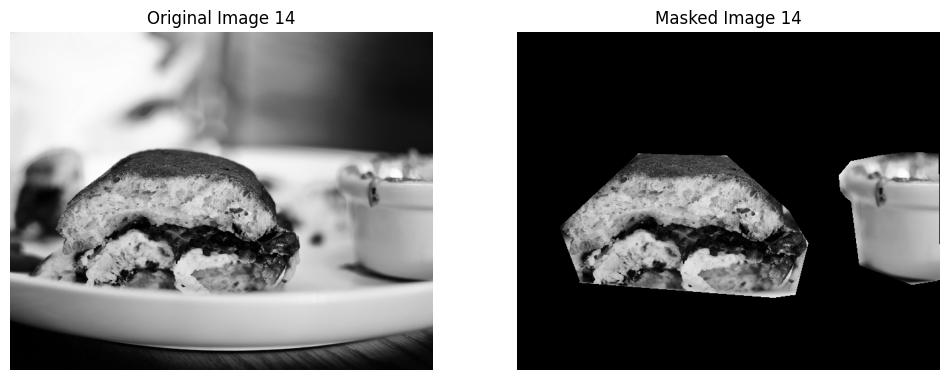

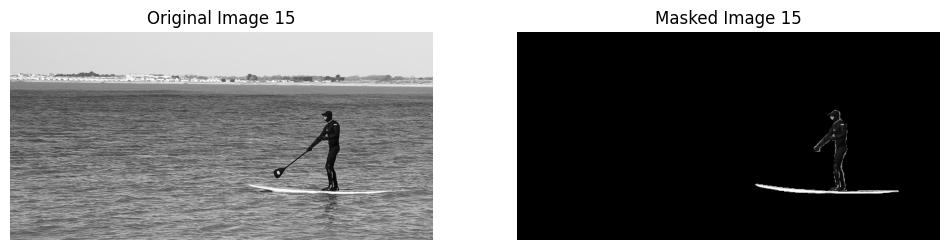

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pycocotools.coco import COCO

# ==========================
# Paths
# ==========================
data_dir = "./"
ann_file = os.path.join(data_dir, "annotations", "instances_val2017.json")
img_dir = os.path.join(data_dir, "val2017")

coco = COCO(ann_file)

# ==========================
# Get COCO image IDs (sorted)
# ==========================
img_ids = coco.getImgIds()
img_ids = sorted(img_ids)

# ==========================
# Show images 6 to 15
# ==========================
for count, img_id in enumerate(img_ids[5:15], start=6):  # 5=6th image, 15=15th
    img_info = coco.loadImgs(img_id)[0]
    img_path = os.path.join(img_dir, img_info["file_name"])

    # Load original image
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Build mask from annotations
    ann_ids = coco.getAnnIds(imgIds=img_id)
    anns = coco.loadAnns(ann_ids)

    mask = np.zeros((img.shape[0], img.shape[1]), dtype=np.uint8)
    for ann in anns:
        mask = np.maximum(mask, coco.annToMask(ann))

    # Apply mask → object only
    object_only = img * np.expand_dims(mask, axis=-1)

    # ==========================
    # Show side by side
    # ==========================
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.imshow(img)
    plt.title(f"Original Image {count}")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(object_only)
    plt.title(f"Masked Image {count}")
    plt.axis("off")

    plt.show()


In [ ]:
# ==========================
# Week 4: Show Real Image and Masked Image (like your notebook)
# ==========================

# Generate predictions
preds_val = model.predict(X_val)

# Convert predictions into binary masks
binary_preds = (preds_val > 0.5).astype(np.uint8)

# Show results
# Pick some random samples from dataset
import cv2

for i in range(3):  # show 3 examples
    idx = random.randint(0, len(X)-1)
    original_img = X[idx]
    mask = y[idx].squeeze()

    # Subject cutout (background black)
    masked_img = original_img * np.expand_dims(mask, axis=-1)

    # Overlay mask in red with transparency
    overlay = original_img.copy()
    overlay[mask == 1] = [255, 0, 0]  # red overlay
    overlay = cv2.addWeighted(original_img, 0.7, overlay, 0.3, 0)

    plt.figure(figsize=(15,5))

    # Original
    plt.subplot(1,5,1)
    plt.imshow(original_img)
    plt.title("Original Image")
    plt.axis("off")

    # Transparent Overlay
    plt.subplot(1,3,2)
    plt.imshow(overlay)
    plt.title("Overlay (Mask Highlighted)")
    plt.axis("off")

    # Subject Cutout
    plt.subplot(1,3,3)
    plt.imshow(masked_img)
    plt.title("Masked Subject")
    plt.axis("off")

    plt.show()



In [ ]:
import cv2
import numpy as np
import glob
import os
from pycocotools.coco import COCO
from skimage.io import imread
import matplotlib.pyplot as plt
from tqdm import tqdm

# ================================
# Paths
# ================================
val_dir = "/content/val2017"
ann_file = "/content/annotations/instances_val2017.json"
output_dir = "/content/resized_masked_val2017"
os.makedirs(output_dir, exist_ok=True)

# Load COCO
coco = COCO(ann_file)
val_images = sorted(glob.glob(os.path.join(val_dir, "*.jpg")))

resize_shape = (255, 255)

# ================================
# Indices of images to visualize
# ================================
visualize_start = 5   # image index 6 (0-based index)
visualize_end = 15    # image index 15

# ================================
# Process each image
# ================================
for idx, img_path in enumerate(tqdm(val_images, desc="Processing Images")):

    # Load original image
    img = imread(img_path)
    if img.ndim == 2:
        img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)

    # Resize image
    img_resized = cv2.resize(img, resize_shape)

    # Load COCO annotations
    img_id = int(os.path.basename(img_path).split(".")[0])
    ann_ids = coco.getAnnIds(imgIds=img_id, iscrowd=None)
    anns = coco.loadAnns(ann_ids)

    # Initialize mask
    combined_mask = np.zeros((img.shape[0], img.shape[1]), dtype=np.uint8)
    for ann in anns:
        combined_mask = np.maximum(combined_mask, coco.annToMask(ann))

    # Resize mask
    mask_resized = cv2.resize(combined_mask, resize_shape, interpolation=cv2.INTER_NEAREST)
    mask_3c = np.stack([mask_resized]*3, axis=-1)

    # Apply mask to get object-only image
    object_only = img_resized * mask_3c

    # Save object-only image
    save_path = os.path.join(output_dir, f"masked_{os.path.basename(img_path)}")
    cv2.imwrite(save_path, cv2.cvtColor(object_only.astype(np.uint8), cv2.COLOR_RGB2BGR))

    # Visualize only images from 6 to 15
    if visualize_start <= idx < visualize_end:
        plt.figure(figsize=(10,5))
        plt.subplot(1,2,1)
        plt.imshow(img_resized)
        plt.title(f"Resized Image")
        plt.axis("off")

        plt.subplot(1,2,2)
        plt.imshow(object_only)
        plt.title(f"Object Only")
        plt.axis("off")
        plt.show()

print(f"✅ All images processed!")


loading annotations into memory...
Done (t=0.97s)
creating index...
index created!


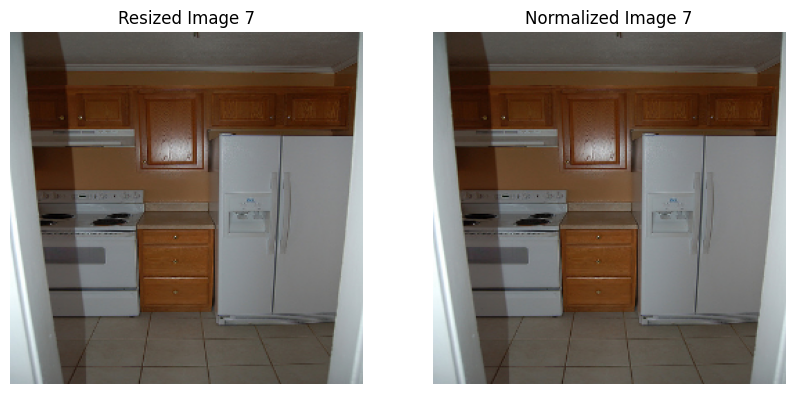

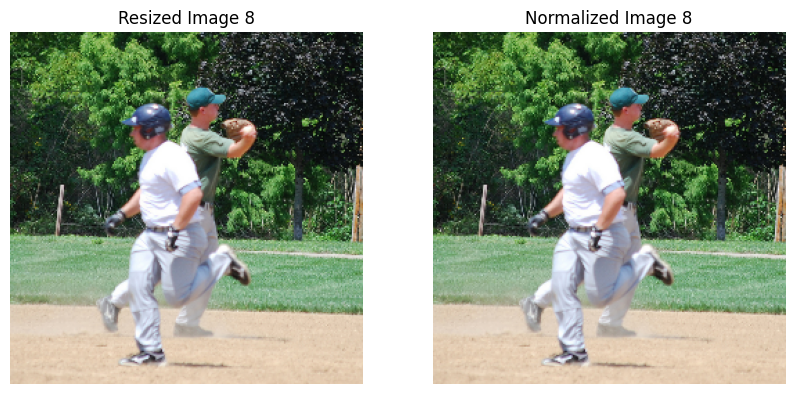

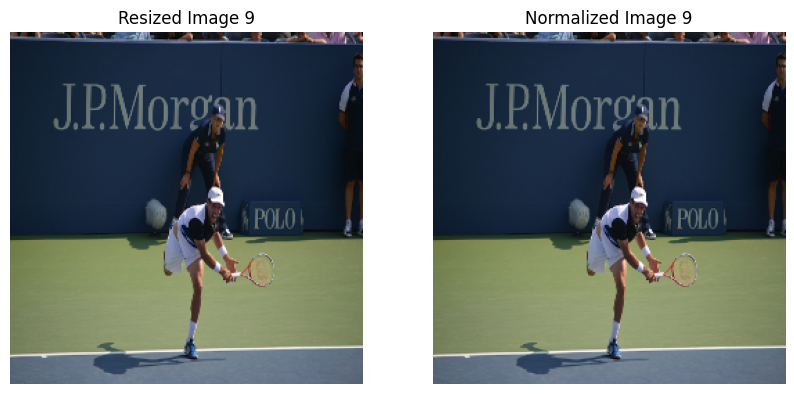

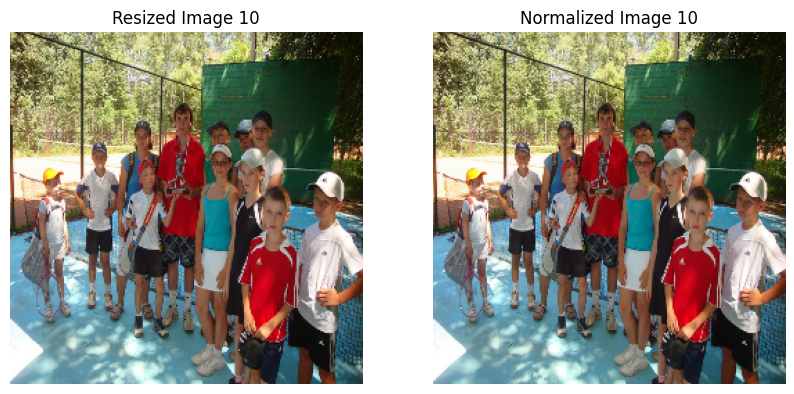

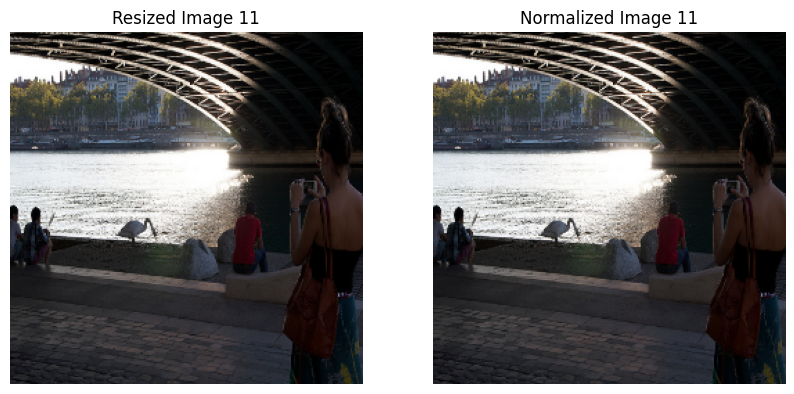

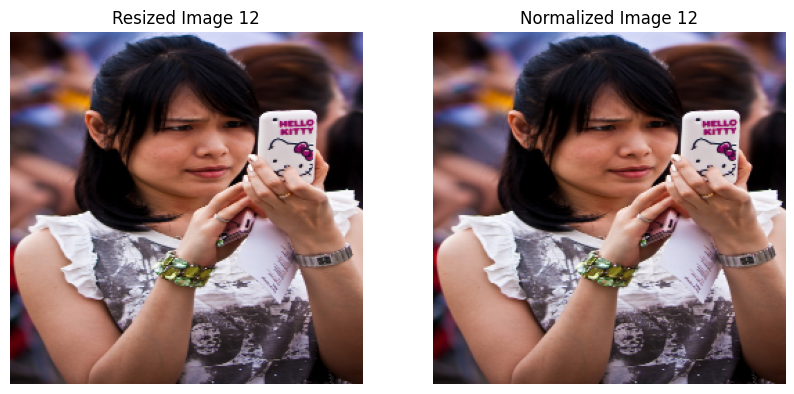

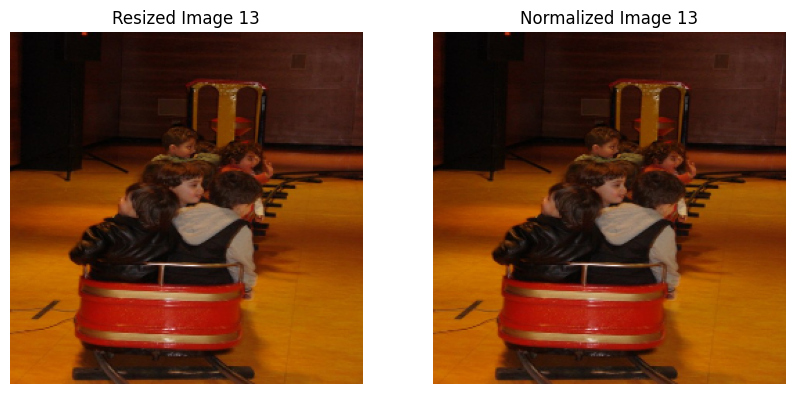

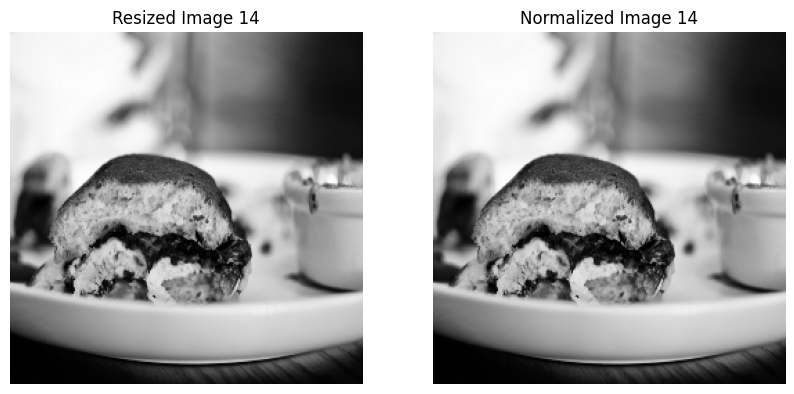

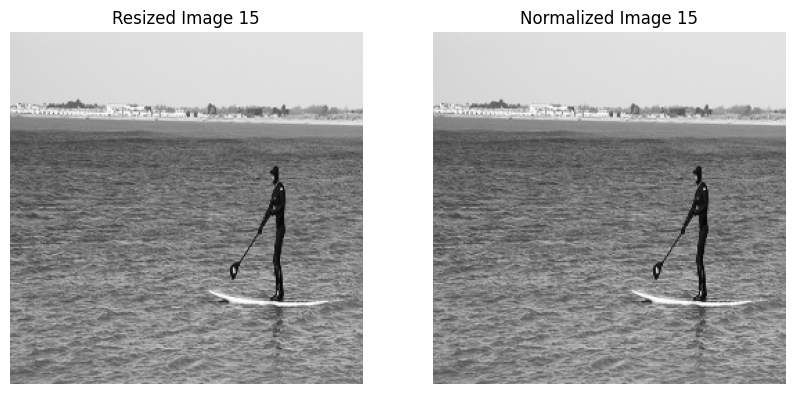

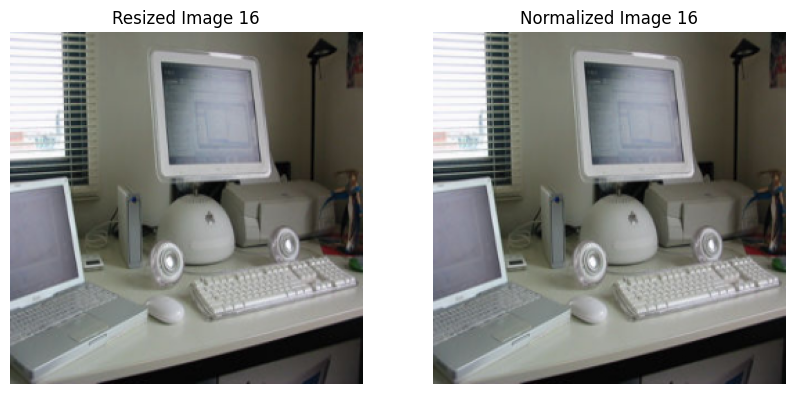

In [ ]:
import cv2
import numpy as np
import glob
import os
from pycocotools.coco import COCO
from skimage.io import imread
import matplotlib.pyplot as plt

# ================================
# Paths
# ================================
val_dir = "/content/val2017"
ann_file = "/content/annotations/instances_val2017.json"
resize_shape = (255, 255)

# Load COCO
coco = COCO(ann_file)
val_images = sorted(glob.glob(os.path.join(val_dir, "*.jpg")))

# ================================
# Select images from index 6 to 15
# ================================
start_idx = 6  # 0-based index → 7th image
end_idx = 16   # exclusive → 15th index
selected_images = val_images[start_idx:end_idx]

# ================================
# Process & display selected images
# ================================
for idx, img_path in enumerate(selected_images, start=start_idx):

    # Load image
    img = imread(img_path)
    if img.ndim == 2:  # grayscale → RGB
        img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)

    # Resize image
    img_resized = cv2.resize(img, resize_shape)

    # Normalize image to [0,1]
    img_normalized = img_resized.astype(np.float32) / 255.0

    # Display resized and normalized side by side
    plt.figure(figsize=(10,5))
    plt.subplot(1,2,1)
    plt.imshow(img_resized)
    plt.title(f"Resized Image {idx+1}")
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(img_normalized)
    plt.title(f"Normalized Image {idx+1}")
    plt.axis("off")
    plt.show()


In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Data augmentation configuration
data_gen_args = dict(
    rotation_range=10,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Create data generators
image_datagen = ImageDataGenerator(**data_gen_args)
mask_datagen = ImageDataGenerator(**data_gen_args)

# Fit the generators on the training data
image_datagen.fit(X_train)
mask_datagen.fit(y_train)

# Combine image and mask generators
train_generator = zip(image_datagen.flow(X_train, batch_size=8, seed=42),
                      mask_datagen.flow(y_train, batch_size=8, seed=42))


print("Data augmentation setup complete. You can now use the 'train_generator' in model.fit.")

In [ ]:
import cv2
import os
import numpy as np
import albumentations as A
from skimage.io import imread

# ================================
# Paths for saving augmented images and masks
# ================================
save_img_dir = "/content/augmented_dataset/images"
save_mask_dir = "/content/augmented_dataset/masks"
os.makedirs(save_img_dir, exist_ok=True)
os.makedirs(save_mask_dir, exist_ok=True)

# Desired resize size
resize_shape = (255, 255)

# ================================
# Define augmentation pipeline (angles, flips, rotations)
# ================================
augment_transform = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.3),
    A.RandomRotate90(p=0.5),
    A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.1, rotate_limit=45, p=0.7),
    A.RandomBrightnessContrast(p=0.5)
])

# ================================
# Select images 6 to 15 from your dataset
# ================================
start_idx = 5  # 6th image (0-based)
end_idx = 15   # 15th image (exclusive)
selected_images = val_images[start_idx:end_idx]

# ================================
# Augment images and save
# ================================
for idx, img_path in enumerate(selected_images, start=start_idx):
    img_id = int(os.path.basename(img_path).split(".")[0])
    I = imread(img_path)

    # Build mask from annotations
    ann_ids = coco.getAnnIds(imgIds=img_id, iscrowd=None)
    anns = coco.loadAnns(ann_ids)
    mask = np.zeros((I.shape[0], I.shape[1]), dtype=np.uint8)
    for ann in anns:
        m = coco.annToMask(ann)
        mask = np.maximum(mask, m)

    # Resize image and mask
    I_resized = cv2.resize(I, resize_shape)
    mask_resized = cv2.resize(mask, resize_shape, interpolation=cv2.INTER_NEAREST)

    # Apply augmentation
    augmented = augment_transform(image=I_resized, mask=mask_resized)
    I_aug = augmented["image"]
    mask_aug = augmented["mask"]

    # Save augmented images and masks
    cv2.imwrite(f"{save_img_dir}/aug_{idx}.jpg", cv2.cvtColor(I_aug, cv2.COLOR_RGB2BGR))
    cv2.imwrite(f"{save_mask_dir}/aug_{idx}.png", mask_aug)

print(f"✅ Augmented images and masks for images saved in {save_img_dir} and {save_mask_dir}")


loading annotations into memory...
Done (t=1.99s)
creating index...
index created!


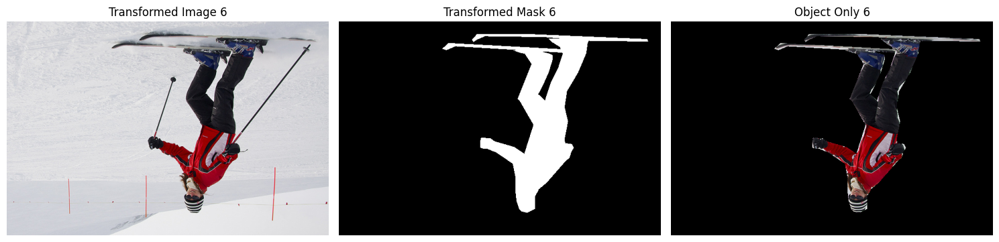

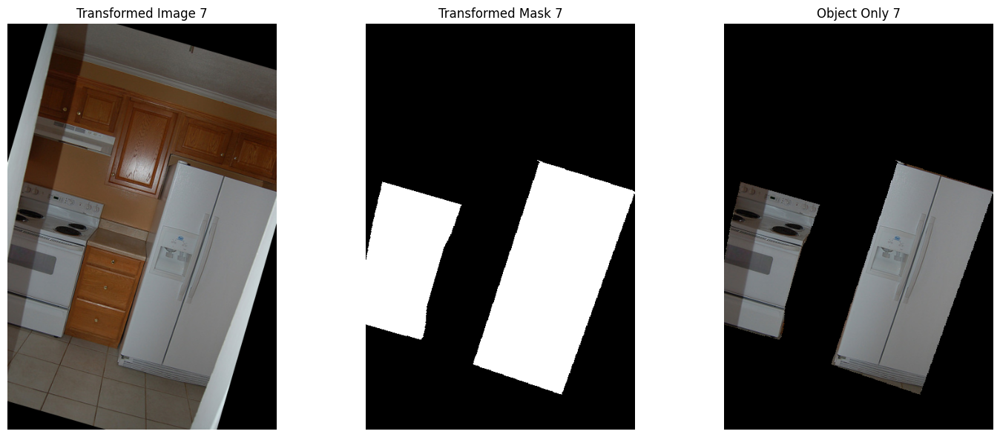

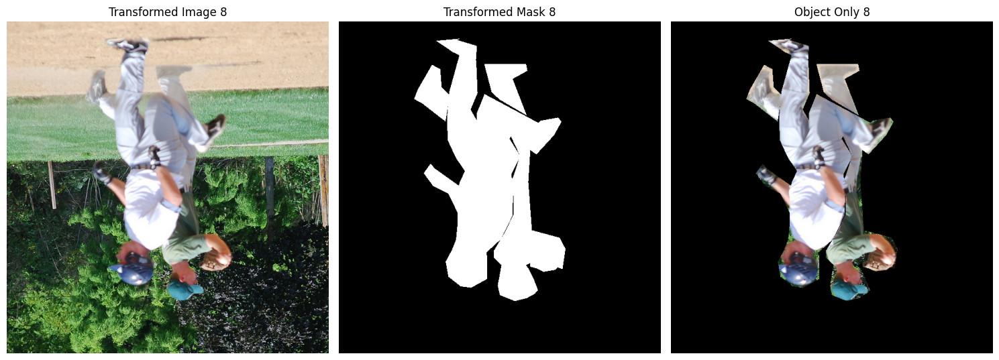

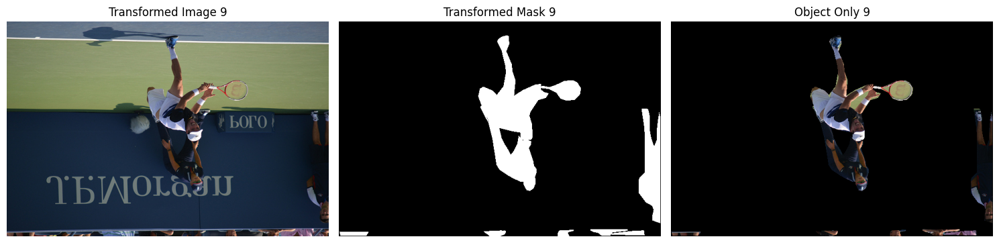

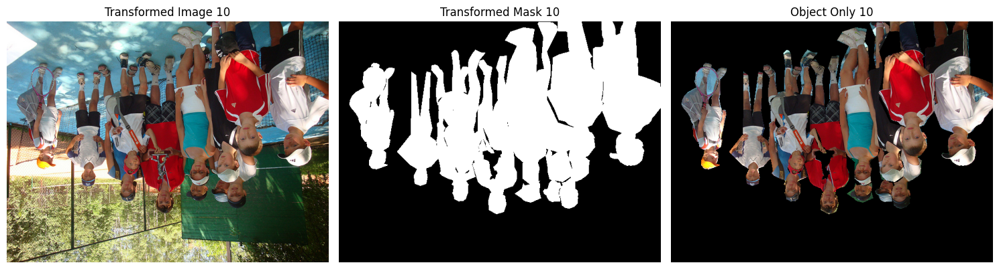

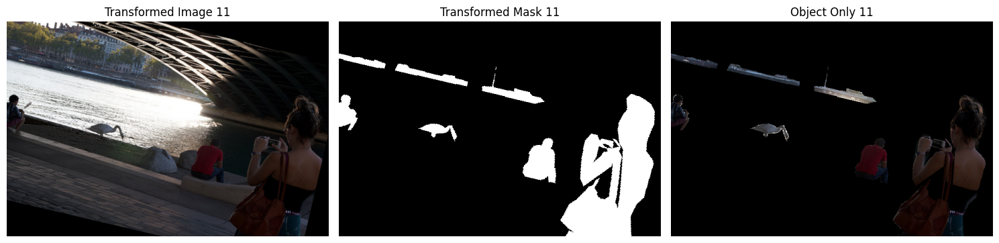

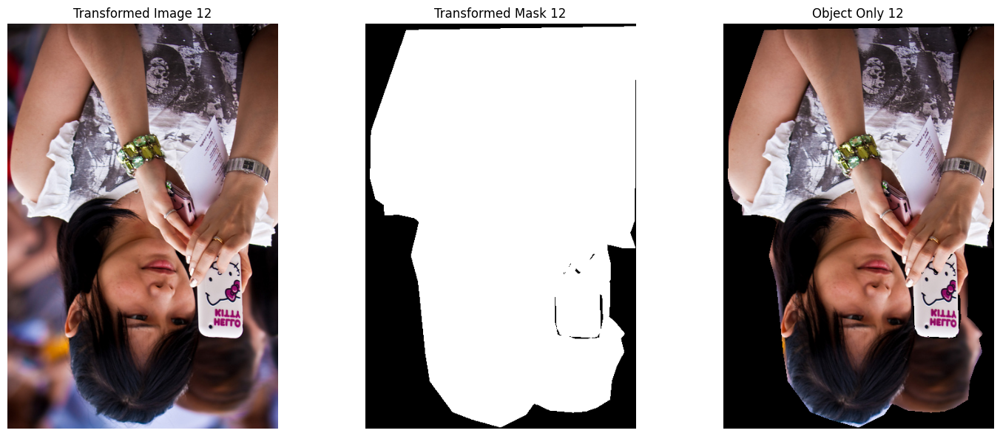

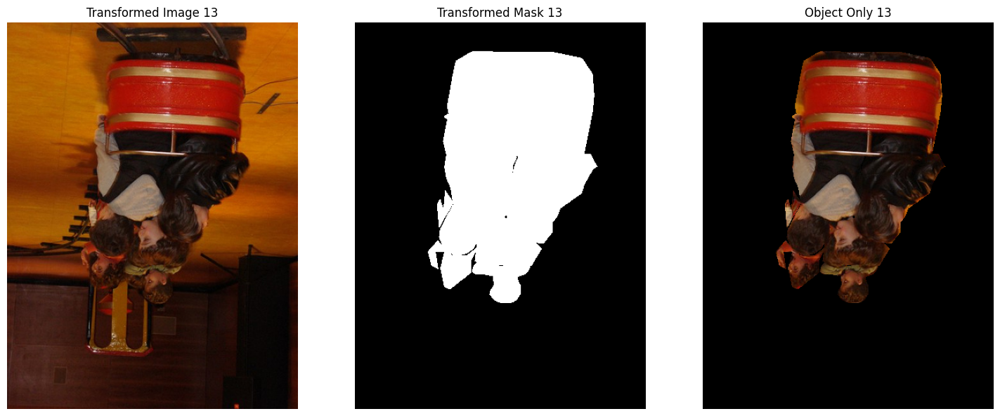

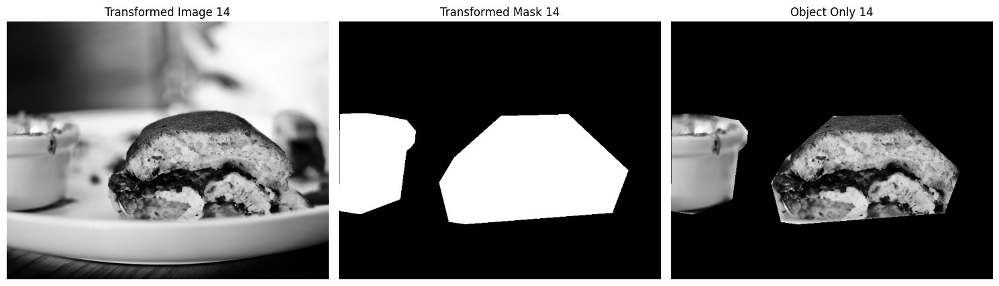

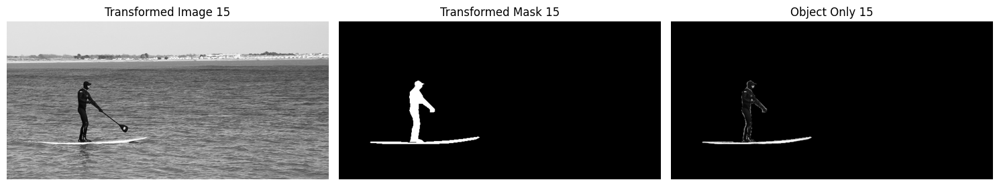

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import albumentations as A
from pycocotools.coco import COCO

# ==========================
# COCO paths
# ==========================
data_dir = "./"
ann_file = os.path.join(data_dir, "annotations", "instances_val2017.json")
img_dir = os.path.join(data_dir, "val2017")

coco = COCO(ann_file)

# ==========================
# Albumentations pipeline
# ==========================
augmenter = A.OneOf([
    A.HorizontalFlip(p=1.0),
    A.VerticalFlip(p=1.0),
    A.RandomRotate90(p=1.0),
    A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.1, rotate_limit=30, p=1.0)
], p=1.0)

# ==========================
# Select images 6–15
# ==========================
img_ids = sorted(coco.getImgIds())
for count, img_id in enumerate(img_ids[5:15], start=6):  # 6th to 15th
    img_info = coco.loadImgs(img_id)[0]
    img_path = os.path.join(img_dir, img_info["file_name"])

    # Load original image in high resolution
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Build mask from annotations
    ann_ids = coco.getAnnIds(imgIds=img_id)
    anns = coco.loadAnns(ann_ids)
    mask = np.zeros((img.shape[0], img.shape[1]), dtype=np.uint8)
    for ann in anns:
        mask = np.maximum(mask, coco.annToMask(ann))

    # Apply augmentation (flip/rotate) to both image & mask
    transformed = augmenter(image=img, mask=mask)
    aug_img, aug_mask = transformed["image"], transformed["mask"]

    # Object-only view
    obj_only = aug_img * np.expand_dims(aug_mask, axis=-1)

    # ==========================
    # Plot (clear high-res)
    # ==========================
    fig, axes = plt.subplots(1, 3, figsize=(15, 6))
    titles = [f"Transformed Image {count}", f"Transformed Mask {count}", f"Object Only {count}"]
    data = [aug_img, aug_mask, obj_only]
    cmaps = [None, "gray", None]

    for ax, d, title, cmap in zip(axes, data, titles, cmaps):
        ax.imshow(d, cmap=cmap)
        ax.set_title(title)
        ax.axis("off")

    plt.tight_layout()
    plt.show()


loading annotations into memory...
Done (t=1.10s)
creating index...
index created!


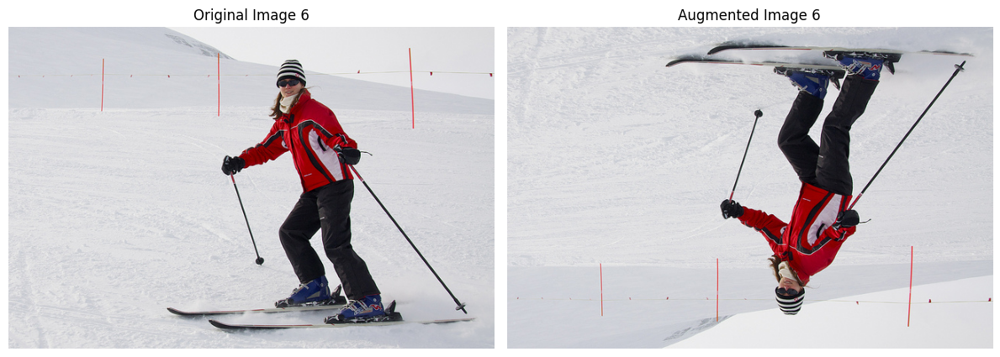

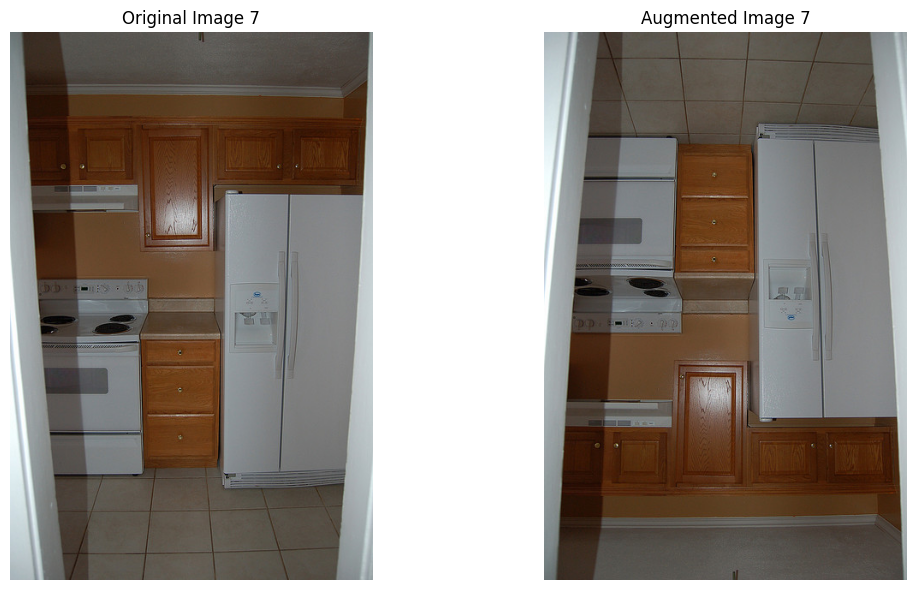

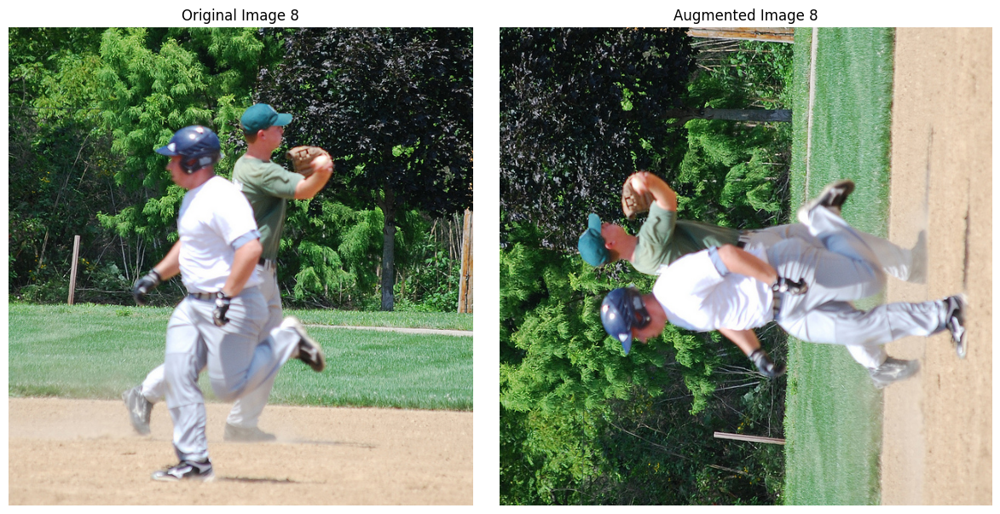

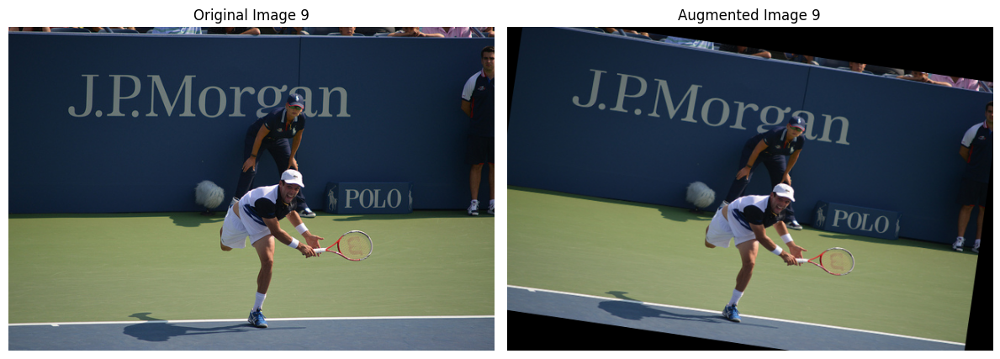

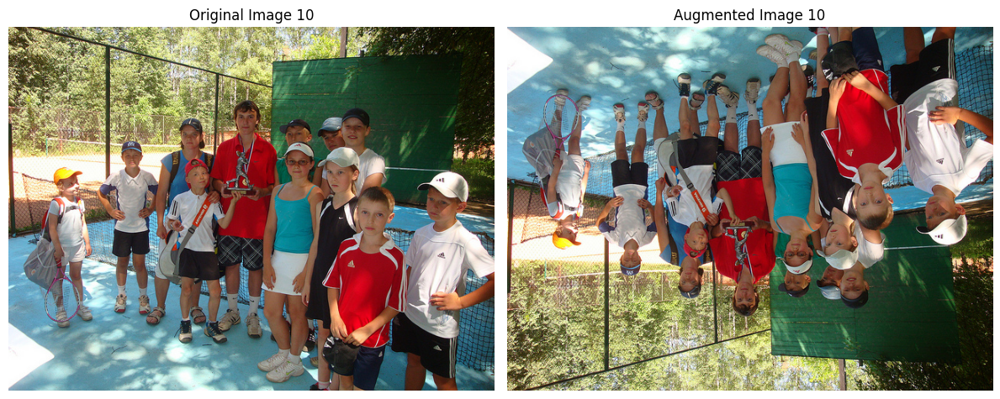

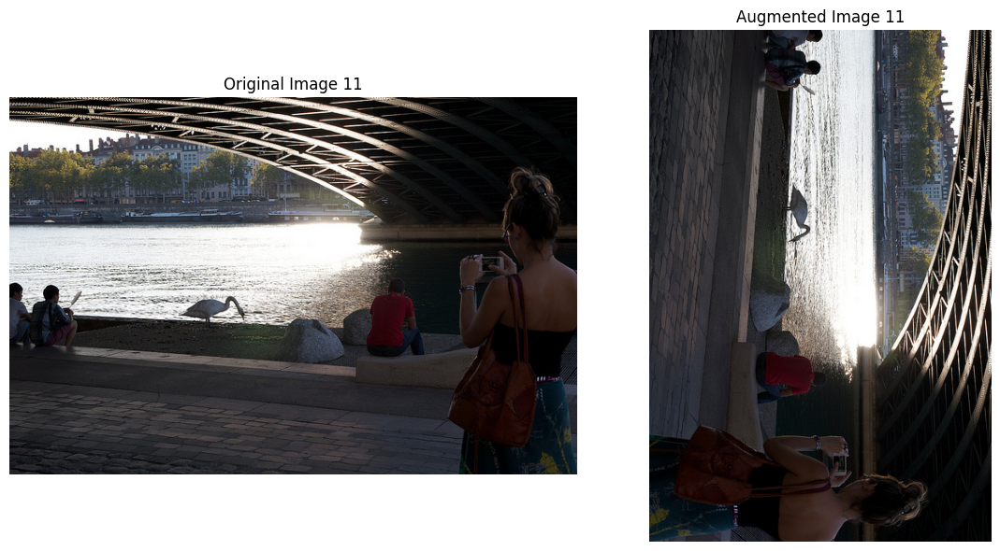

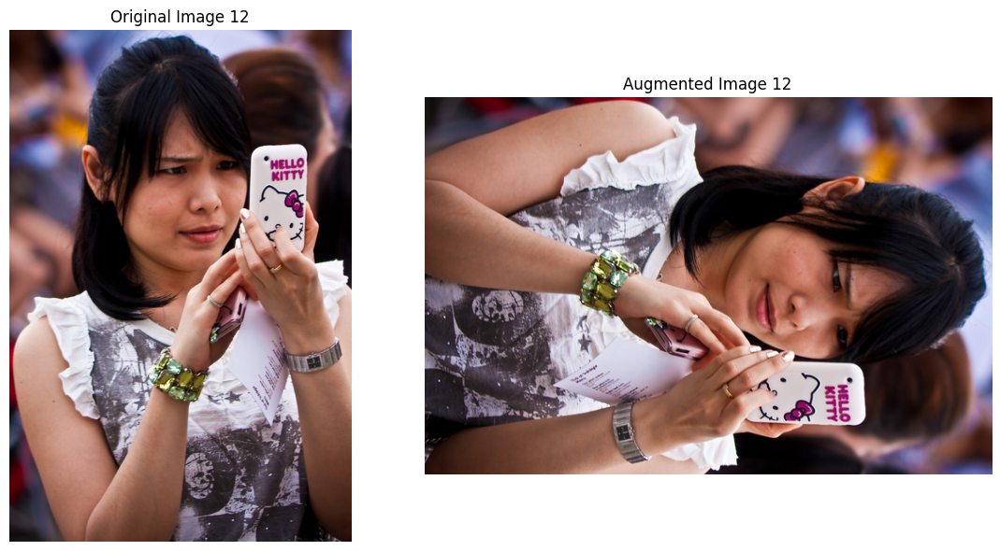

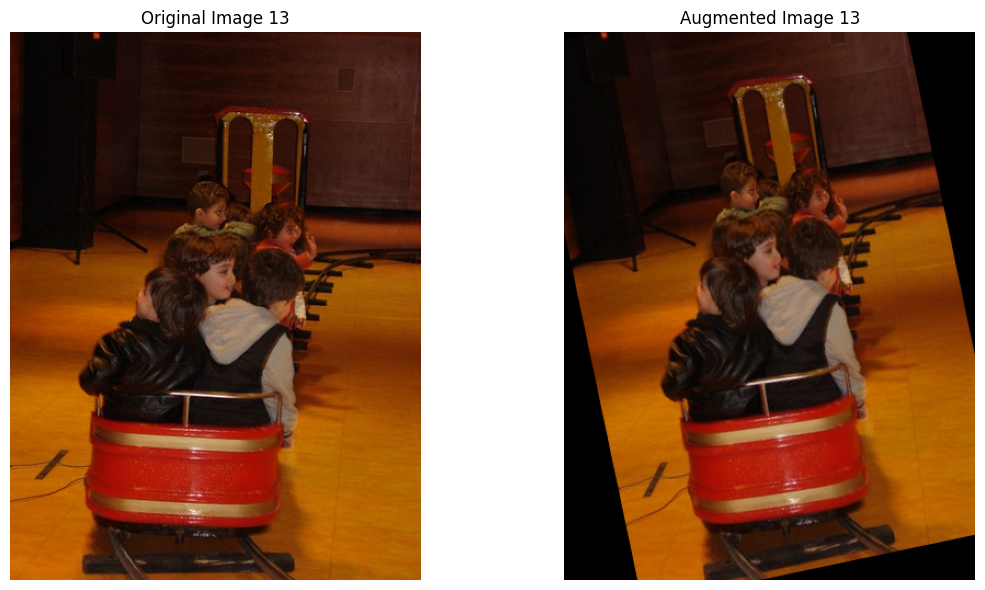

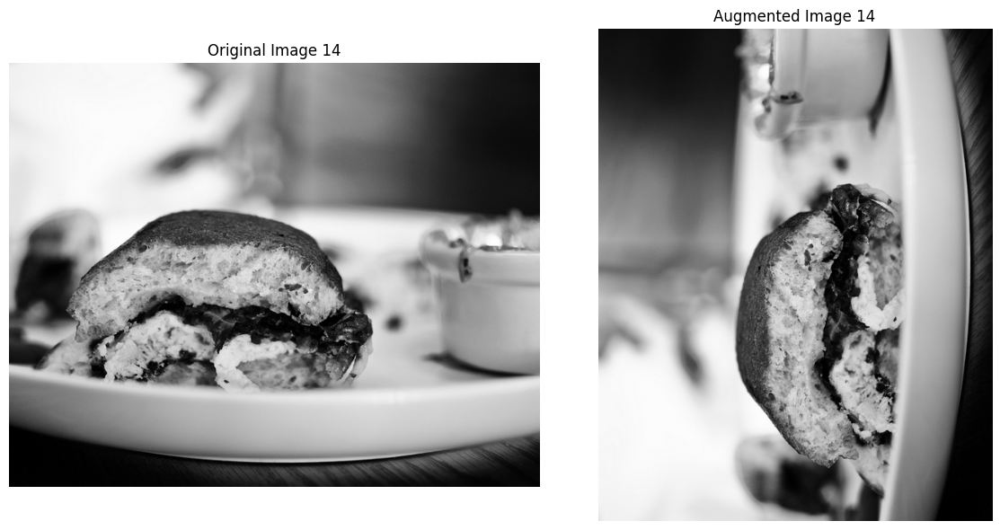

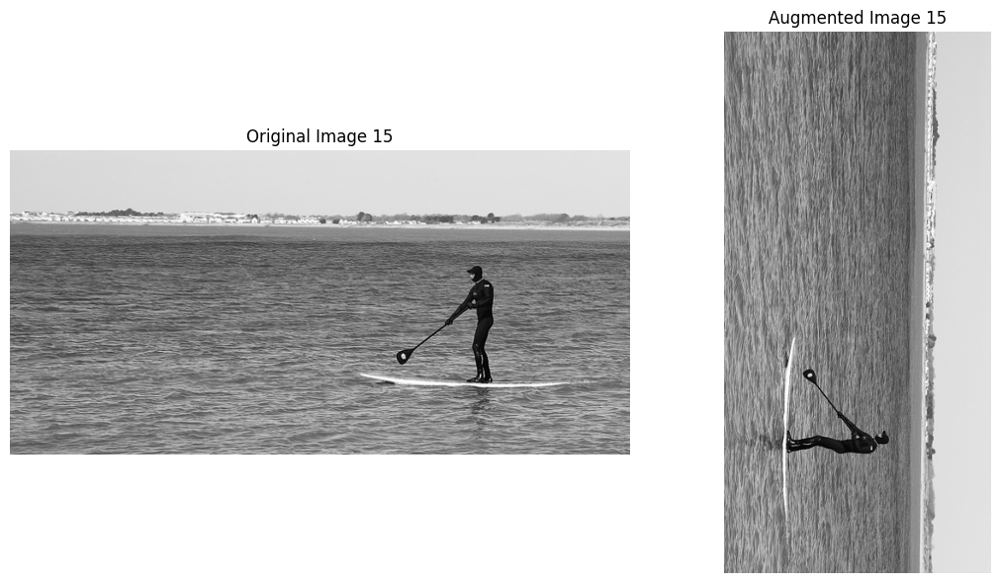

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import albumentations as A
from pycocotools.coco import COCO

# ==========================
# COCO paths
# ==========================
data_dir = "./"
ann_file = os.path.join(data_dir, "annotations", "instances_val2017.json")
img_dir = os.path.join(data_dir, "val2017")

coco = COCO(ann_file)

# ==========================
# Albumentations pipeline (flips + rotations)
# ==========================
augmenter = A.OneOf([
    A.HorizontalFlip(p=1.0),
    A.VerticalFlip(p=1.0),
    A.RandomRotate90(p=1.0),
    A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.1, rotate_limit=30, p=1.0)
], p=1.0)

# ==========================
# Show images 6 to 15
# ==========================
img_ids = sorted(coco.getImgIds())
for count, img_id in enumerate(img_ids[5:15], start=6):  # 6th to 15th
    img_info = coco.loadImgs(img_id)[0]
    img_path = os.path.join(img_dir, img_info["file_name"])

    # Load original image in high resolution
    original_img = cv2.imread(img_path)
    original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)

    # Apply augmentation (flips / rotation)
    transformed = augmenter(image=original_img)
    aug_img = transformed["image"]

    # ==========================
    # Plot: Original vs Augmented
    # ==========================
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    axes[0].imshow(original_img)
    axes[0].set_title(f"Original Image {count}")
    axes[0].axis("off")

    axes[1].imshow(aug_img)
    axes[1].set_title(f"Augmented Image {count}")
    axes[1].axis("off")

    plt.tight_layout()
    plt.show()


Epoch 1/8
30/30 ━━━━━━━━━━━━━━━━━━━━ 108s 2s/step - iou_metric: 7.4436e-06 - loss: 0.4562 - val_iou_metric: 0.0072 - val_loss: 0.4487
Epoch 2/8
30/30 ━━━━━━━━━━━━━━━━━━━━ 80s 2s/step - iou_metric: 0.0738 - loss: 0.4089 - val_iou_metric: 2.5003e-05 - val_loss: 0.4513
Epoch 3/8
30/30 ━━━━━━━━━━━━━━━━━━━━ 83s 2s/step - iou_metric: 0.0033 - loss: 0.4407 - val_iou_metric: 4.5646e-06 - val_loss: 0.4815
Epoch 4/8
30/30 ━━━━━━━━━━━━━━━━━━━━ 79s 2s/step - iou_metric: 0.0063 - loss: 0.4346 - val_iou_metric: 5.2623e-04 - val_loss: 0.4493
Epoch 5/8
30/30 ━━━━━━━━━━━━━━━━━━━━ 82s 2s/step - iou_metric: 0.0180 - loss: 0.4575 - val_iou_metric: 3.3178e-05 - val_loss: 0.4444
Epoch 6/8
30/30 ━━━━━━━━━━━━━━━━━━━━ 82s 2s/step - iou_metric: 6.5531e-04 - loss: 0.4336 - val_iou_metric: 0.0019 - val_loss: 0.4371
Epoch 7/8
30/30 ━━━━━━━━━━━━━━━━━━━━ 47s 2s/step - iou_metric: 0.0077 - loss: 0.4418 - val_iou_metric: 0.0101 - val_loss: 0.4363
Epoch 8/8
30/30 ━━━━━━━━━━━━━━━━━━━━ 82s 2s/step - iou_metric: 0.0247 - 

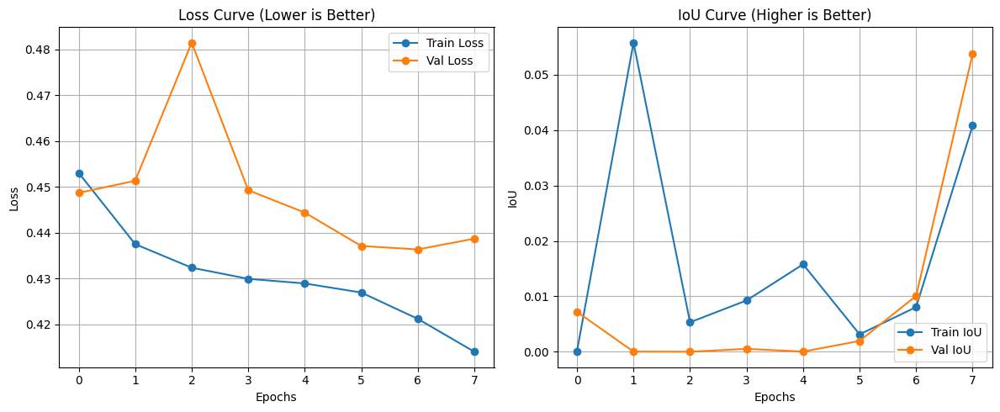


📊 Final Metrics After Training
➡ Train Loss     : 0.4140 (lower means predictions are closer to ground truth)
➡ Train IoU      : 0.0408 (higher means better overlap with masks)
➡ Validation Loss: 0.4387 (generalization on unseen data)
➡ Validation IoU : 0.0537 (quality of segmentation on unseen data)

📑 Metrics per Epoch:
Epoch | Train Loss | Train IoU | Val Loss | Val IoU
--------------------------------------------------
    1 |     0.4530 |    0.0001 |    0.4487 |   0.0072
    2 |     0.4375 |    0.0558 |    0.4513 |   0.0000
    3 |     0.4323 |    0.0053 |    0.4815 |   0.0000
    4 |     0.4299 |    0.0093 |    0.4493 |   0.0005
    5 |     0.4289 |    0.0158 |    0.4444 |   0.0000
    6 |     0.4269 |    0.0031 |    0.4371 |   0.0019
    7 |     0.4212 |    0.0081 |    0.4363 |   0.0101
    8 |     0.4140 |    0.0408 |    0.4387 |   0.0537


In [ ]:
import tensorflow as tf
from tensorflow.keras import backend as K
import matplotlib.pyplot as plt

# ===========================
# 1. IoU Metric Function
# ===========================
def iou_metric(y_true, y_pred, smooth=1e-6):
    # Convert predictions to binary mask
    y_pred = K.cast(y_pred > 0.5, 'float32')
    intersection = K.sum(y_true * y_pred)
    union = K.sum(y_true) + K.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

# ===========================
# 2. Compile Model
# ===========================
model.compile(
    optimizer="adam",
    loss="binary_crossentropy",
    metrics=[iou_metric]
)

# ===========================
# 3. Train Model
# ===========================
history = model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=8,
    batch_size=8,
    verbose=1
)

# ===========================
# 4. Plot Curves
# ===========================
plt.figure(figsize=(12, 5))

# Loss curve
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Train Loss', marker='o')
plt.plot(history.history['val_loss'], label='Val Loss', marker='o')
plt.title("Loss Curve (Lower is Better)")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)

# IoU curve
plt.subplot(1, 2, 2)
plt.plot(history.history['iou_metric'], label='Train IoU', marker='o')
plt.plot(history.history['val_iou_metric'], label='Val IoU', marker='o')
plt.title("IoU Curve (Higher is Better)")
plt.xlabel("Epochs")
plt.ylabel("IoU")
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

# ===========================
# 5. Final Results Summary
# ===========================
print("\n📊 Final Metrics After Training")
print(f"➡ Train Loss     : {history.history['loss'][-1]:.4f} (lower means predictions are closer to ground truth)")
print(f"➡ Train IoU      : {history.history['iou_metric'][-1]:.4f} (higher means better overlap with masks)")
print(f"➡ Validation Loss: {history.history['val_loss'][-1]:.4f} (generalization on unseen data)")
print(f"➡ Validation IoU : {history.history['val_iou_metric'][-1]:.4f} (quality of segmentation on unseen data)")

# ===========================
# 6. Per-epoch Table (Optional)
# ===========================
print("\n📑 Metrics per Epoch:")
print("Epoch | Train Loss | Train IoU | Val Loss | Val IoU")
print("-"*50)
for epoch in range(len(history.history['loss'])):
    print(f"{epoch+1:5d} | {history.history['loss'][epoch]:10.4f} | {history.history['iou_metric'][epoch]:9.4f} | "
          f"{history.history['val_loss'][epoch]:9.4f} | {history.history['val_iou_metric'][epoch]:8.4f}")


In [ ]:
import tensorflow as tf
from tensorflow.keras import backend as K
import time

# ===========================
# IoU Metric
# ===========================
def iou_metric(y_true, y_pred, smooth=1e-6):
    y_pred = K.cast(y_pred > 0.5, 'float32')
    intersection = K.sum(y_true * y_pred)
    union = K.sum(y_true) + K.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

model.compile(optimizer="adam", loss="binary_crossentropy", metrics=[iou_metric])

# ===========================
# Custom Progress Logger Callback
# ===========================
class ProgressLogger(tf.keras.callbacks.Callback):
    def on_train_begin(self, logs=None):
        self.start_time = time.time()

    def on_epoch_end(self, epoch, logs=None):
        elapsed = time.time() - self.start_time
        print(f"Epoch {epoch+1}/{self.params['epochs']}")
        print(f"[Train]: 100% | Train Loss: {logs['loss']:.4f}, "
              f"Train IoU: {logs['iou_metric']:.4f} | "
              f"Val Loss: {logs['val_loss']:.4f}, "
              f"Val IoU: {logs['val_iou_metric']:.4f} | "
              f"Time: {elapsed/60:.2f} min")

# ===========================
# Train with Progress Logger
# ===========================
history = model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=10,
    batch_size=8,
    verbose=0,  # disable default Keras bar
    callbacks=[ProgressLogger()]
)


Epoch 1/10
[Train]: 100% | Train Loss: 0.4257, Train IoU: 0.0477 | Val Loss: 0.4542, Val IoU: 0.0677 | Time: 0.91 min
Epoch 2/10
[Train]: 100% | Train Loss: 0.4141, Train IoU: 0.0953 | Val Loss: 0.4522, Val IoU: 0.1964 | Time: 2.56 min
Epoch 3/10
[Train]: 100% | Train Loss: 0.4091, Train IoU: 0.1581 | Val Loss: 0.4412, Val IoU: 0.1542 | Time: 3.59 min
Epoch 4/10
[Train]: 100% | Train Loss: 0.4018, Train IoU: 0.1728 | Val Loss: 0.4545, Val IoU: 0.1089 | Time: 4.44 min
Epoch 5/10
[Train]: 100% | Train Loss: 0.4000, Train IoU: 0.1328 | Val Loss: 0.4358, Val IoU: 0.1488 | Time: 5.24 min
Epoch 6/10
[Train]: 100% | Train Loss: 0.3968, Train IoU: 0.2123 | Val Loss: 0.4491, Val IoU: 0.1240 | Time: 6.62 min
Epoch 7/10
[Train]: 100% | Train Loss: 0.3853, Train IoU: 0.2028 | Val Loss: 0.4541, Val IoU: 0.1513 | Time: 7.99 min
Epoch 8/10
[Train]: 100% | Train Loss: 0.3834, Train IoU: 0.1843 | Val Loss: 0.4785, Val IoU: 0.2258 | Time: 9.32 min
Epoch 9/10
[Train]: 100% | Train Loss: 0.3901, Train IoU

In [ ]:
import numpy as np
import tensorflow as tf

# Assume you have a trained model
# model = tf.keras.models.load_model('your_model.h5')

# Example validation data
# X_val: shape (num_samples, height, width, channels)
# y_val: shape (num_samples, height, width, 1)

# Get predictions
preds = model.predict(X_val)  # Shape: (num_samples, H, W, 1)

# Convert predictions to binary mask (threshold at 0.5)
pred_masks = (preds > 0.5).astype(np.uint8)  # Shape: (num_samples, H, W, 1)

# The true masks are already in the correct format (y_val)
true_masks = y_val.astype(np.uint8) # Ensure it's uint8 for comparison

# Pixel accuracy: ratio of correctly predicted pixels across all images
# Flatten the arrays to calculate accuracy across all pixels
pixel_accuracy = np.sum(pred_masks == true_masks) / true_masks.size
print(f"Pixel Accuracy: {pixel_accuracy * 100:.2f}%")

# Validation accuracy (mean over images)
# Calculate accuracy for each image and then take the mean
image_accuracies = np.sum(pred_masks == true_masks, axis=(1, 2, 3)) / (true_masks.shape[1] * true_masks.shape[2] * true_masks.shape[3])
val_accuracy = np.mean(image_accuracies)
print(f"Validation Accuracy (Mean over images): {val_accuracy * 100:.2f}%")

2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 987ms/step
Pixel Accuracy: 80.40%
Validation Accuracy (Mean over images): 80.40%
